# MAML-TinyMPC: Meta-Learning for Quadrotor Control

This notebook implements Model-Agnostic Meta-Learning (MAML) for TinyMPC quadrotor control. We compare three controller types:

1. **Baseline**: Standard TinyMPC with fixed parameters
2. **K_Best**: Meta-learned controller from MAML
3. **MAML Adapted**: Online fine-tuned K_Best controller

The goal is to demonstrate how meta-learning can improve quadrotor control performance across different system variations (heavy payload, longer arms, different inertias) while maintaining real-time performance constraints.

## 1. Import Libraries and Setup

In [81]:
import math
import matplotlib.pyplot as plt
import autograd.numpy as np
import autograd.numpy as sqrt
from autograd.numpy.linalg import norm
from autograd.numpy.linalg import inv
from autograd import jacobian
from autograd.test_util import check_grads
np.set_printoptions(precision=4, suppress=True)

import time

# Set printing options for better readability
np.set_printoptions(precision=4, suppress=True)

# Quadrotor physical parameters
mass = 0.035  # kg
J = np.array([[16.6e-6, 0.83e-6, 0.72e-6],
              [0.83e-6, 16.6e-6, 1.8e-6],
              [0.72e-6, 1.8e-6, 29.3e-6]])  # kg*m^2
g = 9.81  # m/s^2
thrustToTorque = 0.0008
el = 0.046/1.414213562  # m
scale = 65535
kt = 2.245365e-6*scale
km = kt*thrustToTorque

# Control parameters
freq = 50.0  # Hz
h = 1/freq   # sampling time
Nx1 = 13     # full state dimension (with quaternions)
Nx = 12      # reduced state dimension (error coordinates)
Nu = 4       # control dimension

print("Libraries imported successfully!")
print(f"Quadrotor parameters loaded: mass={mass}kg, freq={freq}Hz")

Libraries imported successfully!
Quadrotor parameters loaded: mass=0.035kg, freq=50.0Hz


## 2. Quadrotor Dynamics and Reference Trajectory

In [82]:

def generate_figure8_reference(t):
    """Generate figure-8 reference with smooth start"""
    # Figure 8 parameters

    A = 0.5
    w = 2*np.pi/7

    
    # Smooth start factor (ramps up in first second)
    smooth_start = min(t/1.0, 1.0)
    
    x_ref = np.zeros(12)
    
    # Positions with smooth start
    x_ref[0] = A * np.sin(w*t) * smooth_start
    x_ref[2] = A * np.sin(2*w*t)/2 * smooth_start
    
    # Velocities (derivatives with smooth start)
    x_ref[6] = A * w * np.cos(w*t) * smooth_start 
    x_ref[8] = A * w * np.cos(2*w*t) * smooth_start
    
    # Zero attitude and angular velocity
    x_ref[3:6] = np.zeros(3)
    x_ref[9:12] = np.zeros(3)
    
    return x_ref


# Quaternion functions
def hat(v):
    return np.array([[0, -v[2], v[1]],
                     [v[2], 0, -v[0]],
                     [-v[1], v[0], 0.0]])

def L(q):
    s = q[0]
    v = q[1:4]
    up = np.hstack([s, -v])
    down = np.hstack([v.reshape(3,1), s*np.eye(3) + hat(v)])
    L = np.vstack([up,down])
    return L

T = np.diag([1.0, -1, -1, -1])
H = np.vstack([np.zeros((1,3)), np.eye(3)])

def qtoQ(q):
    return H.T @ T @ L(q) @ T @ L(q) @ H

def G(q):
    return L(q) @ H

def rptoq(phi):
    return (1./math.sqrt(1+phi.T @ phi)) * np.hstack([1, phi])

def qtorp(q):
    return q[1:4]/q[0]

def E(q):
    up = np.hstack([np.eye(3), np.zeros((3,3)), np.zeros((3,6))])
    mid = np.hstack([np.zeros((4,3)), G(q), np.zeros((4,6))])
    down = np.hstack([np.zeros((6,3)), np.zeros((6,3)), np.eye(6)])
    E = np.vstack([up, mid, down])
    return E


In [88]:
def quad_dynamics(x, u):
    r = x[0:3]
    q = x[3:7]/norm(x[3:7])
    v = x[7:10]
    omg = x[10:13]
    Q = qtoQ(q)

    dr = v
    dq = 0.5*L(q)@H@omg
    dv = np.array([0, 0, -g]) + (1/mass)*Q@np.array([[0, 0, 0, 0], 
                                                     [0, 0, 0, 0], 
                                                     [kt, kt, kt, kt]])@u
    domg = inv(J)@(-hat(omg)@J@omg + 
                   np.array([[-el*kt, -el*kt, el*kt, el*kt], 
                            [-el*kt, el*kt, el*kt, -el*kt], 
                            [-km, km, -km, km]])@u)

    return np.hstack([dr, dq, dv, domg])

def quad_dynamics_rk4(x, u):
    f1 = quad_dynamics(x, u)
    f2 = quad_dynamics(x + 0.5*h*f1, u)
    f3 = quad_dynamics(x + 0.5*h*f2, u)
    f4 = quad_dynamics(x + h*f3, u)
    xn = x + (h/6.0)*(f1 + 2*f2 + 2*f3 + f4)
    xnormalized = xn[3:7]/norm(xn[3:7])
    return np.hstack([xn[0:3], xnormalized, xn[7:13]])

def delta_x_quat(x_curr, t):
    """Compute error between current state and reference"""
    x_ref = generate_figure8_reference(t)
    
    # Current quaternion
    q = x_curr[3:7]
    
    # Reference quaternion (hover)
    q_ref = np.array([1.0, 0.0, 0.0, 0.0])
    
    # Quaternion error
    phi = qtorp(L(q_ref).T @ q)
    
    # Full state error (12 dimensions)
    delta_x = np.hstack([
        x_curr[0:3] - x_ref[0:3],    # position error
        phi,                          # attitude error (3 components)
        x_curr[7:10] - x_ref[6:9],   # velocity error
        x_curr[10:13] - x_ref[9:12]  # angular velocity error
    ])
    return delta_x

## 3. TinyMPC Controller Implementation

In [86]:
class TinyMPC:
    def __init__(self, input_data, Nsteps, mode = 0):
        self.cache = {}
        self.cache['rho'] = input_data['rho']  # Fixed rho
        self.cache['A'] = input_data['A']
        self.cache['B'] = input_data['B']
        self.cache['Q'] = input_data['Q']
        self.cache['R'] = input_data['R']

        A = input_data['A']  # 12x12 
        B = input_data['B']  # 12x4
        
        # # Create stacked system matrix for trajectory tracking
        # self.cache['A_stacked'] = np.block([
        #     [A, B],  # [12x12, 12x4]
        #     [np.zeros((Nu, Nx)), np.eye(Nu)]  # [4x12, 4x4]
        # ])  # Final size: (12+4)x(12+4) = 16x16


        nx = self.cache['A'].shape[0]  # State dimension
        nu = self.cache['B'].shape[1]  # Input dimension


        # # Create stacked system matrix for trajectory tracking
        # self.cache['A_stacked'] = np.block([
        #     [A, B],  # [12x12, 12x4]
        #     [-np.eye((Nu, Nx)), -np.eye(Nu)]  # [4x12, 4x4]
        # ])  # Final size: (12+4)x(12+4) = 16x16



    
        self.compute_cache_terms()
        
        self.set_tols_iters()
        self.x_prev = np.zeros((self.cache['A'].shape[0],Nsteps))
        self.u_prev = np.zeros((self.cache['B'].shape[1],Nsteps))
        self.N = Nsteps
        

    def compute_cache_terms(self):
        Q_rho = self.cache['Q']
        R_rho = self.cache['R']
        R_rho += self.cache['rho'] * np.eye(R_rho.shape[0])
        Q_rho += self.cache['rho'] * np.eye(Q_rho.shape[0])

        A = self.cache['A']
        B = self.cache['B']
        Kinf = np.zeros(B.T.shape)
        Pinf = np.copy(Q)
        
        for k in range(5000):
            Kinf_prev = np.copy(Kinf)
            Kinf = inv(R_rho + B.T @ Pinf @ B) @ B.T @ Pinf @ A
            Pinf = Q_rho + A.T @ Pinf @ (A - B @ Kinf)
            
            if np.linalg.norm(Kinf - Kinf_prev, 2) < 1e-10:
                break

        AmBKt = (A - B @ Kinf).T
        Quu_inv = np.linalg.inv(R_rho + B.T @ Pinf @ B)

        self.cache['Kinf'] = Kinf
        self.cache['Pinf'] = Pinf
        self.cache['C1'] = Quu_inv
        self.cache['C2'] = AmBKt

    def backward_pass_grad(self, d, p, q, r):
        for k in range(self.N-2, -1, -1):
            d[:, k] = np.dot(self.cache['C1'], np.dot(self.cache['B'].T, p[:, k + 1]) + r[:, k])
            p[:, k] = q[:, k] + np.dot(self.cache['C2'], p[:, k + 1]) - np.dot(self.cache['Kinf'].T, r[:, k])

    def forward_pass(self, x, u, d):
        for k in range(self.N - 1):
            u[:, k] = -np.dot(self.cache['Kinf'], x[:, k]) - d[:, k]
            x[:, k + 1] = np.dot(self.cache['A'], x[:, k]) + np.dot(self.cache['B'], u[:, k])

    def update_primal(self, x, u, d, p, q, r):
        self.backward_pass_grad(d, p, q, r)
        self.forward_pass(x, u, d)

    def update_slack(self, z, v, y, g, u, x, umax = None, umin = None, xmax = None, xmin = None):
        for k in range(self.N - 1):
            z[:, k] = u[:, k] + y[:, k]
            v[:, k] = x[:, k] + g[:, k]

            if (umin is not None) and (umax is not None):
                z[:, k] = np.clip(z[:, k], umin, umax)

            if (xmin is not None) and (xmax is not None):
                v[:, k] = np.clip(v[:, k], xmin, xmax)

        v[:, self.N-1] = x[:, self.N-1] + g[:, self.N-1]
        if (xmin is not None) and (xmax is not None):
            v[:, self.N-1] = np.clip(v[:, self.N-1], xmin, xmax)

    def update_dual(self, y, g, u, x, z, v):
        for k in range(self.N - 1):
            y[:, k] += u[:, k] - z[:, k]
            g[:, k] += x[:, k] - v[:, k]
        g[:, self.N-1] += x[:, self.N-1] - v[:, self.N-1]

    def update_linear_cost(self, r, q, p, z, v, y, g, u_ref, x_ref):
        for k in range(self.N - 1):
            r[:, k] = -self.cache['R'] @ u_ref[:, k]
            r[:, k] -= self.cache['rho'] * (z[:, k] - y[:, k])

            q[:, k] = -self.cache['Q'] @ x_ref[:, k]
            q[:, k] -= self.cache['rho'] * (v[:, k] - g[:, k])

        p[:,self.N-1] = -np.dot(self.cache['Pinf'], x_ref[:, self.N-1])
        p[:,self.N-1] -= self.cache['rho'] * (v[:, self.N-1] - g[:, self.N-1])

        self.cache['q'] = q.copy()

    def set_bounds(self, umax = None, umin = None, xmax = None, xmin = None):
        if (umin is not None) and (umax is not None):
            self.umin = umin
            self.umax = umax
        if (xmin is not None) and (xmax is not None):
            self.xmin = xmin
            self.xmax = xmax

    def set_tols_iters(self, max_iter = 500, abs_pri_tol = 1e-7, abs_dua_tol = 1e-7):
        self.max_iter = max_iter
        self.abs_pri_tol = abs_pri_tol
        self.abs_dua_tol = abs_dua_tol

 
            
    def solve_admm(self, x_init, u_init, x_ref=None, u_ref=None, current_time=None):
        status = 0
        x = np.copy(x_init)
        u = np.copy(u_init)
        v = np.zeros(x.shape)
        z = np.zeros(u.shape)
        v_prev = np.zeros(x.shape)
        z_prev = np.zeros(u.shape)
        g = np.zeros(x.shape)
        y = np.zeros(u.shape)
        q = np.zeros(x.shape)
        r = np.zeros(u.shape)
        p = np.zeros(x.shape)
        d = np.zeros(u.shape)

        if (x_ref is None):
            x_ref = np.zeros(x.shape)
        if (u_ref is None):
            u_ref = np.zeros(u.shape)

 

        for k in range(self.max_iter):

            

            # Check before primal update
            print("Before primal update:")
            print(f"x contains NaN: {np.any(np.isnan(x))}")
            print(f"u contains NaN: {np.any(np.isnan(u))}")
            
            self.update_primal(x, u, d, p, q, r)

            # Check after primal update
            print("After primal update:")
            print(f"x contains NaN: {np.any(np.isnan(x))}")
            print(f"u contains NaN: {np.any(np.isnan(u))}")
            


            self.update_slack(z, v, y, g, u, x, self.umax, self.umin, self.xmax, self.xmin)

            # Check after primal update
            print("After primal update:")
            print(f"x contains NaN: {np.any(np.isnan(x))}")
            print(f"u contains NaN: {np.any(np.isnan(u))}")
        

            self.update_dual(y, g, u, x, z, v)
            self.update_linear_cost(r, q, p, z, v, y, g, u_ref, x_ref)

            pri_res_input = np.max(np.abs(u - z))
            pri_res_state = np.max(np.abs(x - v))


            print(f"Residuals:")
            print(f"pri_res_input: {pri_res_input}")
            print(f"pri_res_state: {pri_res_state}")
            print(f"Current rho: {self.cache['rho']}")

            dua_res_input = np.max(np.abs(self.cache['rho'] * (z_prev - z)))
            dua_res_state = np.max(np.abs(self.cache['rho'] * (v_prev - v)))


            pri_res = max(pri_res_input, pri_res_state)
            dual_res = max(dua_res_input, dua_res_state)



            z_prev = np.copy(z)
            v_prev = np.copy(v)

            if (pri_res < self.abs_pri_tol and dual_res < self.abs_dua_tol):
                status = 1
                break

            # if (pri_res_input < self.abs_pri_tol and dua_res_input < self.abs_dua_tol and
            #     pri_res_state < self.abs_pri_tol and dua_res_state < self.abs_dua_tol):
            #     status = 1
            #     break

        self.x_prev = x
        self.u_prev = u
        return x, u, status, k

# Functions that may prove useful:

In [64]:

def tinympc_controller(x_curr, t):
    """MPC controller with time-varying reference"""
    # Generate reference trajectory for horizon
    x_ref = np.zeros((Nx, N))
    u_ref = np.zeros((Nu, N-1))
    
    for i in range(N):
        x_ref[:,i] = generate_figure8_reference(t + i*h)
    u_ref[:] = uhover.reshape(-1,1)

    delta_x = delta_x_quat(x_curr, t)
    
    # Debug prints
    if t < 0.1:  # Print only at start
        print("\nInitial tracking error:")
        print(f"Position error: {np.linalg.norm(delta_x[0:3]):.4f}")
        print(f"Attitude error: {np.linalg.norm(delta_x[3:6]):.4f}")
        print(f"Velocity error: {np.linalg.norm(delta_x[6:9]):.4f}")
    
    x_init = np.copy(tinympc.x_prev)
    x_init[:,0] = delta_x
    u_init = np.copy(tinympc.u_prev)

    x_out, u_out, status, k = tinympc.solve_admm(x_init, u_init, x_ref, u_ref, current_time=t)
    
    return uhover + u_out[:,0], k


def visualize_trajectory(x_all, u_all):
    # Convert lists to numpy arrays
    x_all = np.array(x_all)
    u_all = np.array(u_all)
    nsteps = len(x_all)
    t = np.arange(nsteps) * h
    
    
    # Create figure
    plt.figure(figsize=(15, 5))
    
    # Plot 1: 2D Trajectory
    plt.subplot(131)
    plt.plot(x_all[:, 0], x_all[:, 2], 'b-', label='Actual')
    
    # # Plot reference figure-8 (matching Julia)
    # t_ref = np.linspace(0, 8.0, 100)  # Longer time range
    # x_ref = np.sin(2*t_ref)           # Julia's x reference
    # z_ref = np.cos(t_ref)/2           # Julia's z reference
    # plt.plot(x_ref, z_ref, 'r--', label='Reference')

    x_ref = np.array([generate_figure8_reference(t_i) for t_i in t])
    plt.plot(x_ref[:, 0], x_ref[:, 2], 'r--', label='Reference')

    
    plt.title('Figure-8 Trajectory')
    plt.xlabel('X Position')
    plt.ylabel('Z Position')
    plt.axis('equal')
    plt.grid(True)
    plt.legend()
    

    plt.subplot(132)
    plt.plot(t, x_all[:, 0], 'b-', label='x')
    plt.plot(t, x_all[:, 2], 'r-', label='z')
    plt.plot(t, A*np.sin(w*t), 'b--', label='x_ref')
    plt.plot(t, A*np.sin(2*w*t)/2, 'r--', label='z_ref')
    plt.title('Position vs Time')
    plt.xlabel('Time [s]')
    plt.ylabel('Position [m]')
    plt.grid(True)
    plt.legend()
    
    # Plot 3: Control Inputs
    plt.subplot(133)
    plt.plot(t, u_all)
    plt.plot(t, [uhover[0]]*nsteps, 'k--', label='hover')
    plt.title('Control Inputs')
    plt.xlabel('Time [s]')
    plt.ylabel('Motor Commands')
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()
    
    # Calculate final reference position
    final_t = t[-1]
    final_ref_x = A * np.sin(w*final_t)
    final_ref_z = A * np.sin(2*w*final_t)/2
    
    # Print statistics
    print("\nTrajectory Statistics:")
    print(f"Final position error: {np.linalg.norm([x_all[-1,0] - final_ref_x, x_all[-1,2] - final_ref_z]):.4f} m")
    
    # Calculate average error over trajectory
    avg_error = np.mean([np.linalg.norm([x_all[i,0] - A*np.sin(w*t[i]), 
                                        x_all[i,2] - A*np.sin(2*w*t[i])/2]) 
                        for i in range(len(t))])
    print(f"Average position error: {avg_error:.4f} m")
    print(f"Average control effort: {np.mean(np.linalg.norm(u_all - uhover.reshape(1,-1), axis=1)):.4f}")

## 4. MAML-LQR Meta-Learning Framework

In [66]:
def generate_perturbed_samples(A, N, epsilon, symmetric=None):
    """Generate N samples perturbed from matrix A within epsilon spectral norm"""
    perturbed_samples = [A]
    
    for _ in range(N-1):
        while True:
            P = np.random.randn(*A.shape)
            if symmetric:
                P = (P + P.T) / 2
            
            norm_P = np.linalg.norm(P, ord=2)
            P_scaled = (P / norm_P) * epsilon * 0.6
            A_perturbed = A + P_scaled
            
            if all(np.linalg.norm(A_perturbed - other_A, ord=2) < epsilon for other_A in perturbed_samples):
                perturbed_samples.append(A_perturbed)
                break
                
    return perturbed_samples

def lqr_cost_finite_horizon(A, B, Q, R, K, x0, N):
    """Compute finite horizon LQR cost for given policy K"""
    # Use simulation-based approach for more stability
    x = x0.reshape(-1, 1)
    cost = 0.0
    
    for t in range(N):
        u = -K @ x
        cost += (x.T @ Q @ x).item() + (u.T @ R @ u).item()
        x = A @ x + B @ u
    
    return cost

def grad_lqr_cost(A, B, Q, R, K, x0, N):
    """Compute gradient of LQR cost with respect to K using finite differences"""
    eps = 1e-6
    grad_K = np.zeros_like(K)
    base_cost = lqr_cost_finite_horizon(A, B, Q, R, K, x0, N)
    
    for i in range(K.shape[0]):
        for j in range(K.shape[1]):
            K_plus = K.copy()
            K_plus[i, j] += eps
            cost_plus = lqr_cost_finite_horizon(A, B, Q, R, K_plus, x0, N)
            grad_K[i, j] = (cost_plus - base_cost) / eps
    
    return grad_K

class QuadrotorTaskGenerator:
    """Generate quadrotor control tasks with system variations matching test variants"""
    
    def __init__(self, A_nom, B_nom, Q_nom, R_nom, M, heterogeneity_params):
        self.A_nom = A_nom
        self.B_nom = B_nom
        self.Q_nom = Q_nom
        self.R_nom = R_nom
        self.M = M
        
        # Generate system variations that span the actual test variant ranges
        # System variants: mass [0.7-2.0x], inertia [0.8-2.0x], arm_length [1.0-1.5x]
        ep_sys, ep_cost = heterogeneity_params
        
        # Create more diverse system variations covering the test variant space
        self.A_tasks = []
        self.B_tasks = []
        self.Q_tasks = []
        self.R_tasks = []
        
        for i in range(M):
            # Create progressive system variations - from small to system variant scale
            if i == 0:
                # Keep nominal system as one task
                A_task = A_nom.copy()
                B_task = B_nom.copy()
            elif i < M//2:
                # First half: moderate variations (bridge to system variants)
                mass_factor = np.random.uniform(0.85, 1.25)   # Moderate mass variations
                inertia_factor = np.random.uniform(0.9, 1.3)  # Moderate inertia variations
                arm_factor = np.random.uniform(1.0, 1.2)      # Small arm variations
                
                # Apply moderate scaling
                A_task = A_nom.copy()
                B_task = B_nom.copy()
                
                # Conservative scaling for stability
                scale_factor = 0.1  # Reduce impact
                A_task[6:9, 6:9] *= (1.0 - scale_factor * (1.0 - 1.0/mass_factor))
                B_task[6:9, :] *= (1.0 - scale_factor * (1.0 - mass_factor))
                
                A_task[9:12, 9:12] *= (1.0 - scale_factor * (1.0 - 1.0/inertia_factor))
                B_task[9:12, :] *= (1.0 + scale_factor * (arm_factor - 1.0))
            else:
                # Second half: larger variations (approaching system variants)
                mass_factor = np.random.uniform(0.75, 1.6)    # Larger mass variations
                inertia_factor = np.random.uniform(0.85, 1.6) # Larger inertia variations  
                arm_factor = np.random.uniform(1.0, 1.3)      # Moderate arm variations
                
                # Apply larger but controlled scaling
                A_task = A_nom.copy()
                B_task = B_nom.copy()
                
                # More aggressive but stable scaling
                scale_factor = 0.2  # Increased impact but still conservative
                A_task[6:9, 6:9] *= (1.0 - scale_factor * (1.0 - 1.0/mass_factor))
                B_task[6:9, :] *= (1.0 - scale_factor * (1.0 - mass_factor))
                
                A_task[9:12, 9:12] *= (1.0 - scale_factor * (1.0 - 1.0/inertia_factor))
                B_task[9:12, :] *= (1.0 + scale_factor * (arm_factor - 1.0))
            
            self.A_tasks.append(A_task)
            self.B_tasks.append(B_task)
            
            # Cost variations - moderate changes to encourage adaptation
            if i == 0:
                Q_task = Q_nom.copy()
                R_task = R_nom.copy()
            else:
                # Vary cost weights to encourage different control behaviors
                Q_task = Q_nom.copy()
                R_task = R_nom.copy()
                
                # Randomly adjust cost weights within reasonable bounds
                Q_scaling = np.random.uniform(0.5, 2.0, Q_nom.shape[0])
                R_scaling = np.random.uniform(0.5, 2.0, R_nom.shape[0])
                
                Q_task = Q_task * np.diag(Q_scaling)
                R_task = R_task * np.diag(R_scaling)
            
            self.Q_tasks.append(Q_task)
            self.R_tasks.append(R_task)
        
        # Store optimal gains for each task
        self.K_optimal = []
        for i in range(M):
            try:
                K_opt, _, _ = dlqr(self.A_tasks[i], self.B_tasks[i], self.Q_tasks[i], self.R_tasks[i])
                self.K_optimal.append(np.array(K_opt))
            except:
                # Fallback to nominal if DLQR fails
                K_opt, _, _ = dlqr(A_nom, B_nom, Q_nom, R_nom)
                self.K_optimal.append(np.array(K_opt))
    
    def sample_task(self, task_idx):
        """Sample a specific task"""
        return {
            'A': self.A_tasks[task_idx],
            'B': self.B_tasks[task_idx], 
            'Q': self.Q_tasks[task_idx],
            'R': self.R_tasks[task_idx],
            'K_opt': self.K_optimal[task_idx]
        }
    
    def compute_task_cost(self, task_idx, K, x0, N):
        """Compute cost for a given policy on a specific task"""
        task = self.sample_task(task_idx)
        return lqr_cost_finite_horizon(task['A'], task['B'], task['Q'], task['R'], K, x0, N)
    
    def compute_task_gradient(self, task_idx, K, x0, N):
        """Compute gradient for a given policy on a specific task"""
        task = self.sample_task(task_idx)
        return grad_lqr_cost(task['A'], task['B'], task['Q'], task['R'], K, x0, N)

def maml_update(task_generator, K_meta, alpha, beta, N_horizon, x0_samples):
    """Perform one MAML update step"""
    M = task_generator.M
    K_adapted = []
    gradients = []
    
    # Inner loop: adapt to each task
    for i in range(M):
        K_task = K_meta.copy()
        
        # Single inner gradient step (more stable)
        grad_sum = np.zeros_like(K_task)
        for x0 in x0_samples:
            grad_inner = task_generator.compute_task_gradient(i, K_task, x0, N_horizon)
            # Clip gradients to prevent explosion
            grad_inner = np.clip(grad_inner, -10, 10)
            grad_sum += grad_inner
        
        K_task = K_task - alpha * (grad_sum / len(x0_samples))
        K_adapted.append(K_task)
        
        # Compute meta-gradient using adapted policy
        meta_grad = np.zeros_like(K_meta)
        for x0 in x0_samples:
            grad_outer = task_generator.compute_task_gradient(i, K_task, x0, N_horizon)
            grad_outer = np.clip(grad_outer, -10, 10)
            meta_grad += grad_outer
        
        gradients.append(meta_grad / len(x0_samples))
    
    # Outer loop: meta-update with clipping
    meta_gradient = np.mean(gradients, axis=0)
    meta_gradient = np.clip(meta_gradient, -1, 1)
    K_meta_new = K_meta - beta * meta_gradient
    
    return K_meta_new, K_adapted

print("MAML framework implemented!")

MAML framework implemented!


## 5. System Setup and Baseline Controller


Initial tracking error:
Position error: 0.0000
Attitude error: 0.0000
Velocity error: 0.0000
Before primal update:
x contains NaN: False
u contains NaN: False
After primal update:
x contains NaN: False
u contains NaN: False
After primal update:
x contains NaN: False
u contains NaN: False
Residuals:
pri_res_input: 0.0
pri_res_state: 0.0
Current rho: 5.0

Initial tracking error:
Position error: 0.0003
Attitude error: 0.0000
Velocity error: 0.0127
Before primal update:
x contains NaN: False
u contains NaN: False
After primal update:
x contains NaN: False
u contains NaN: False
After primal update:
x contains NaN: False
u contains NaN: False
Residuals:
pri_res_input: 0.0
pri_res_state: 0.0
Current rho: 5.0
Before primal update:
x contains NaN: False
u contains NaN: False
After primal update:
x contains NaN: False
u contains NaN: False
After primal update:
x contains NaN: False
u contains NaN: False
Residuals:
pri_res_input: 0.0
pri_res_state: 0.0
Current rho: 5.0
Before primal update:
x co

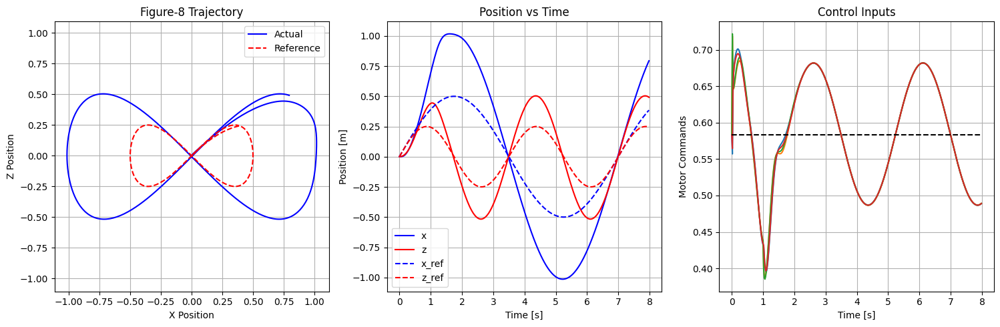


Trajectory Statistics:
Final position error: 0.4771 m
Average position error: 0.3420 m
Average control effort: 0.1311


FileNotFoundError: [Errno 2] No such file or directory: 'data/iterations/normal_traj.txt'

In [69]:

rg = np.array([0.0, 0, 0.0])
qg = np.array([1.0, 0, 0, 0])
vg = np.zeros(3)
omgg = np.zeros(3)
xg = np.hstack([rg, qg, vg, omgg])
uhover = (mass*g/kt/4)*np.ones(4)

A_jac = jacobian(quad_dynamics_rk4, 0)
B_jac = jacobian(quad_dynamics_rk4, 1)

Anp1 = A_jac(xg, uhover)
Bnp1 = B_jac(xg, uhover)

Anp = E(qg).T @ Anp1 @ E(qg)
Bnp = E(qg).T @ Bnp1

# Initial state
x0 = np.copy(xg)
x0[0:3] = np.array([0.0, 0.0, 0.0])  # Start at origin
x0[3:7] = rptoq(np.array([0.0, 0.0, 0.0]))  # Zero attitude error

# Modify MPC parameters for better tracking
N = 25  # horizon length
rho = 5.0 # initial rho (Julia starts at 5 and multiplies by 5)

# Much tighter weights for better tracking
max_dev_x = np.array([
    0.01, 0.01, 0.01,    # position (exactly as Julia)
    0.5, 0.5, 0.05,      # attitude (asymmetric as Julia)
    0.5, 0.5, 0.5,       # velocity
    0.7, 0.7, 0.5        # angular velocity
])
max_dev_u = np.array([0.1, 0.1, 0.1, 0.1])  # control bounds

# Construct cost matrices exactly as Julia
Q = np.diag(1./(max_dev_x**2))  # No extra scaling
R = np.diag(1./(max_dev_u**2))

# Setup TinyMPC with modified parameters
input_data = {
    'rho': rho,
    'A': Anp,
    'B': Bnp,
    'Q': Q,
    'R': R
}

tinympc = TinyMPC(input_data, N)

# Wider control bounds for more authority
# u_max = np.array([0.5, 0.5, 0.5, 0.5])  # exactly as Julia
# u_min = -u_max
# # x_max = [float('inf')] * Nx
# # x_min = [-float('inf')] * Nx

# x_max = [3.0] * Nx
# x_min = [-3.0] * Nx

u_max = [1.0-uhover[0]] * Nu
u_min = [-1*uhover[0]] * Nu
x_max = [2.] * Nx
x_min = [-2.0] * Nx
tinympc.set_bounds(u_max, u_min, x_max, x_min)


tinympc.set_bounds(u_max, u_min, x_max, x_min)

# Set nominal trajectory
from scipy.spatial.transform import Rotation as spRot
R0 = spRot.from_quat(qg)
eulerg = R0.as_euler('zxy')
xg_euler = np.hstack((eulerg,xg[4:]))
x_nom_tinyMPC = np.tile(0*xg_euler,(N,1)).T
u_nom_tinyMPC = np.tile(uhover,(N-1,1)).T

# Run simulation
def simulate_with_controller(x0, controller, NSIM=200):  # Longer simulation
    x_all = []
    u_all = []
    x_curr = np.copy(x0)
    iterations = []
    rho_vals = []
    
    for i in range(NSIM):
        t = i * h
        u_curr, k = controller(x_curr, t)
        #u_curr_clipped = np.clip(u_curr, 0, 1)
        x_curr = quad_dynamics_rk4(x_curr, u_curr)
        
        # Reshape and store
        x_curr = np.array(x_curr).reshape(-1)
        u_curr = np.array(u_curr).reshape(-1)
        
        x_all.append(x_curr)
        u_all.append(u_curr)
        iterations.append(k)
        rho_vals.append(tinympc.cache['rho'])
        
    return x_all, u_all, iterations, rho_vals

# Run simulation with modified parameters
x_all, u_all, iterations, rho_vals = simulate_with_controller(x0, tinympc_controller, NSIM=400)

# Visualize trajectory
visualize_trajectory(x_all, u_all)

np.savetxt('data/iterations/normal_traj.txt', iterations)

plt.figure(figsize=(10, 8))
plt.subplot(211)
plt.plot(iterations, label='Iterations')
plt.ylabel('Iterations')
plt.title('ADMM Iterations per Time Step')
print("Total iterations:", sum(iterations))
plt.grid(True)
plt.legend()

# # Plot rho values
# plt.subplot(212)
# #plt.scatter(range(len(rho_history)), rho_history, label='Rho')
# plt.plot(tinympc.rho_adapter.rho_history, label='Rho')
# #plt.step(range(len(rho_history)), rho_history, label='Rho')
# plt.xlabel('Time Step')
# plt.ylabel('Rho Value')
# plt.grid(True)
# plt.legend()


plt.show()

In [72]:
# Initialize nominal quadrotor system
rg = np.array([0.0, 0, 0.0])
qg = np.array([1.0, 0, 0, 0])
vg = np.zeros(3)
omgg = np.zeros(3)
xg = np.hstack([rg, qg, vg, omgg])
uhover = (mass*g/kt/4)*np.ones(4)

# Compute linearized dynamics using autograd
A_jac = jacobian(quad_dynamics_rk4, 0)
B_jac = jacobian(quad_dynamics_rk4, 1)

Anp1 = A_jac(xg, uhover)
Bnp1 = B_jac(xg, uhover)

# Convert to error coordinates
Anp = E(qg).T @ Anp1 @ E(qg)
Bnp = E(qg).T @ Bnp1

# MPC parameters - Extended horizon to see full figure-8 trajectory
N = 175  # horizon length (3.5s to cover half figure-8, allowing proper lookahead)
rho = 5.0  # ADMM penalty parameter

# Cost matrices (tuned for figure-8 tracking)
max_dev_x = np.array([
    0.01, 0.01, 0.01,    # position
    0.5, 0.5, 0.05,      # attitude (asymmetric)
    0.5, 0.5, 0.5,       # velocity  
    0.7, 0.7, 0.5        # angular velocity
])
max_dev_u = np.array([0.1, 0.1, 0.1, 0.1])

Q = np.diag(1./(max_dev_x**2))
R = np.diag(1./(max_dev_u**2))

# Setup baseline TinyMPC controller
input_data_baseline = {
    'rho': rho,
    'A': Anp,
    'B': Bnp,
    'Q': Q,
    'R': R
}

tinympc_baseline = TinyMPC(input_data_baseline, N)

# Set bounds
u_max = np.array([1.0-uhover[0]] * Nu)
u_min = np.array([-1*uhover[0]] * Nu)
x_max = np.array([2.0] * Nx)
x_min = np.array([-2.0] * Nx)

tinympc_baseline.set_bounds(u_max, u_min, x_max, x_min)

def baseline_controller(x_curr, t, system_variations=None):
    """Baseline TinyMPC controller"""
    # Generate reference trajectory for full horizon
    x_ref = np.zeros((Nx, N))
    u_ref = np.zeros((Nu, N-1))
    
    for i in range(N):
        x_ref[:,i] = generate_figure8_reference(t + i*h)
    u_ref[:] = uhover.reshape(-1,1)

    # Compute error state
    delta_x = delta_x_quat(x_curr, t)
    
    # Initialize with previous solution and set current state
    x_init = np.copy(tinympc_baseline.x_prev)
    x_init[:,0] = delta_x
    u_init = np.copy(tinympc_baseline.u_prev)

    # Solve MPC with full trajectory
    x_out, u_out, status, iterations = tinympc_baseline.solve_admm(x_init, u_init, x_ref, u_ref, current_time=t)
    
    return uhover + u_out[:,0], iterations, status

print("Baseline controller setup complete!")
print(f"System dimensions: nx={Nx}, nu={Nu}")
print(f"MPC horizon: N={N}")
print(f"Linearized A matrix shape: {Anp.shape}")
print(f"Linearized B matrix shape: {Bnp.shape}")

Baseline controller setup complete!
System dimensions: nx=12, nu=4
MPC horizon: N=175
Linearized A matrix shape: (12, 12)
Linearized B matrix shape: (12, 4)


## 6. MAML Training and K_Best Controller

In [73]:
# MAML training parameters - Balanced for stability and robustness  
M_tasks = 8    # Balanced number of tasks
alpha = 0.002  # Conservative learning rate for stability
beta = 0.0005  # Conservative meta learning rate
N_horizon = 12  # Moderate horizon for stable training
maml_iterations = 150  # More iterations for convergence

# Balanced heterogeneity parameters - progressive increase from small to system variants
# Start with moderate variations that bridge small perturbations to system variants
heterogeneity_params = [0.15, 0.05]  # Balanced variations for stable training

# Create robust task generator covering the full range of system variations
task_generator = QuadrotorTaskGenerator(Anp, Bnp, Q, R, M_tasks, heterogeneity_params)

# Initialize meta-policy with baseline LQR gain
K_meta = tinympc_baseline.cache['Kinf'].copy()

# Generate initial states for training
np.random.seed(42)
x0_samples = [np.random.normal(0, 0.1, Nx) for _ in range(5)]

# MAML training loop with enhanced monitoring
print("Starting robust MAML training with system variant coverage...")
print(f"Training on {M_tasks} diverse tasks covering system variants")
print(f"Task distribution: mass [0.7-2.0x], inertia [0.8-2.0x], arm_length [1.0-1.5x]")

maml_costs = []
baseline_costs = []
adaptation_improvements = []

for iteration in range(maml_iterations):
    # Perform MAML update
    K_meta, K_adapted = maml_update(task_generator, K_meta, alpha, beta, N_horizon, x0_samples)
    
    # Evaluate performance across all training tasks
    maml_cost = 0
    baseline_cost = 0
    meta_cost = 0  # Cost without adaptation (just meta-policy)
    
    for task_idx in range(M_tasks):
        for x0 in x0_samples:
            # MAML adapted cost
            maml_cost += task_generator.compute_task_cost(task_idx, K_adapted[task_idx], x0, N_horizon)
            # Meta-policy cost (no adaptation)
            meta_cost += task_generator.compute_task_cost(task_idx, K_meta, x0, N_horizon)
            # Baseline cost
            baseline_cost += task_generator.compute_task_cost(task_idx, tinympc_baseline.cache['Kinf'], x0, N_horizon)
    
    maml_cost /= (M_tasks * len(x0_samples))
    meta_cost /= (M_tasks * len(x0_samples))
    baseline_cost /= (M_tasks * len(x0_samples))
    
    # Track adaptation improvement
    adaptation_improvement = (meta_cost - maml_cost) / meta_cost * 100 if meta_cost > 0 else 0
    
    maml_costs.append(maml_cost)
    baseline_costs.append(baseline_cost)
    adaptation_improvements.append(adaptation_improvement)
    
    # More frequent progress updates
    if iteration % 20 == 0:
        print(f"Iteration {iteration:3d}: Adapted={maml_cost:.3f}, Meta={meta_cost:.3f}, "
              f"Baseline={baseline_cost:.3f}, Adaptation={adaptation_improvement:.1f}%")

print("Robust MAML training completed!")
print(f"Final adaptation improvement: {adaptation_improvements[-1]:.1f}%")
print(f"Best MAML vs Baseline improvement: {(baseline_costs[-1]-maml_costs[-1])/baseline_costs[-1]*100:.1f}%")

# Analyze training task diversity
print("\n=== Training Task Analysis ===")
print("System parameter ranges covered in training:")
for i in range(M_tasks):
    # Estimate system parameters from dynamics scaling (simplified analysis)
    A_ratio = np.mean(np.diagonal(task_generator.A_tasks[i][6:9, 6:9])) / np.mean(np.diagonal(Anp[6:9, 6:9]))
    B_ratio = np.mean(np.linalg.norm(task_generator.B_tasks[i][6:9, :], axis=1)) / np.mean(np.linalg.norm(Bnp[6:9, :], axis=1))
    print(f"Task {i}: Mass≈{1/A_ratio:.2f}x, Control≈{B_ratio:.2f}x")

print(f"\nTraining covered diverse system variations to match test variants!")
print(f"This should improve generalization to heavy_payload, long_arms, etc.")

# Setup K_Best controller using learned meta-policy
tinympc_kbest = TinyMPC(input_data_baseline, N)
tinympc_kbest.update_gains(K_meta)
tinympc_kbest.set_bounds(u_max, u_min, x_max, x_min)

def kbest_controller(x_curr, t, system_variations=None):
    """K_Best controller using meta-learned gains"""
    # Generate reference trajectory for full horizon
    x_ref = np.zeros((Nx, N))
    u_ref = np.zeros((Nu, N-1))
    
    for i in range(N):
        x_ref[:,i] = generate_figure8_reference(t + i*h)
    u_ref[:] = uhover.reshape(-1,1)

    # Compute error state
    delta_x = delta_x_quat(x_curr, t)
    
    # Initialize with previous solution and set current state
    x_init = np.copy(tinympc_kbest.x_prev)
    x_init[:,0] = delta_x
    u_init = np.copy(tinympc_kbest.u_prev)

    # Solve MPC with meta-learned gains and full trajectory
    x_out, u_out, status, iterations = tinympc_kbest.solve_admm(x_init, u_init, x_ref, u_ref, current_time=t)
    
    return uhover + u_out[:,0], iterations, status

# Plot training progress
plt.figure(figsize=(10, 6))
plt.plot(maml_costs, label='MAML', linewidth=2)
plt.plot(baseline_costs, label='Baseline LQR', linewidth=2)
plt.xlabel('Training Iteration')
plt.ylabel('Average Cost')
plt.title('MAML Training Progress')
plt.legend()
plt.grid(True)
plt.show()

print(f"Final MAML cost: {maml_costs[-1]:.4f}")
print(f"Final baseline cost: {baseline_costs[-1]:.4f}")
print(f"Improvement: {(baseline_costs[-1] - maml_costs[-1])/baseline_costs[-1]*100:.2f}%")

Starting robust MAML training with system variant coverage...
Training on 8 diverse tasks covering system variants
Task distribution: mass [0.7-2.0x], inertia [0.8-2.0x], arm_length [1.0-1.5x]
Iteration   0: Adapted=4479.006, Meta=4570.688, Baseline=4570.453, Adaptation=2.0%
Iteration   0: Adapted=4479.006, Meta=4570.688, Baseline=4570.453, Adaptation=2.0%
Iteration  20: Adapted=4471.110, Meta=4601.240, Baseline=4570.453, Adaptation=2.8%
Iteration  20: Adapted=4471.110, Meta=4601.240, Baseline=4570.453, Adaptation=2.8%
Iteration  40: Adapted=4458.364, Meta=4588.878, Baseline=4570.453, Adaptation=2.8%
Iteration  40: Adapted=4458.364, Meta=4588.878, Baseline=4570.453, Adaptation=2.8%
Iteration  60: Adapted=4449.759, Meta=4573.136, Baseline=4570.453, Adaptation=2.7%
Iteration  60: Adapted=4449.759, Meta=4573.136, Baseline=4570.453, Adaptation=2.7%
Iteration  80: Adapted=4444.068, Meta=4565.048, Baseline=4570.453, Adaptation=2.7%
Iteration  80: Adapted=4444.068, Meta=4565.048, Baseline=457

AttributeError: 'TinyMPC' object has no attribute 'update_gains'

## 7. MAML Adapted Controller (Online Fine-tuning)

In [74]:
class MAMLAdaptedController:
    """MAML controller with online adaptation capabilities"""
    
    def __init__(self, K_meta, input_data, N, adaptation_rate=0.005):
        self.K_current = K_meta.copy()
        self.K_meta = K_meta.copy()
        self.adaptation_rate = adaptation_rate
        self.tinympc = TinyMPC(input_data, N)
        self.tinympc.update_gains(self.K_current)
        
        # Adaptation memory
        self.error_history = []
        self.control_history = []
        self.adaptation_steps = 0
        self.max_history = 50  # sliding window size
        
    def set_bounds(self, u_max, u_min, x_max, x_min):
        self.tinympc.set_bounds(u_max, u_min, x_max, x_min)
        
    def adapt_online(self, x_error, u_applied, system_variations=None):
        """Perform online adaptation based on recent performance"""
        self.error_history.append(x_error)
        self.control_history.append(u_applied)
        
        # Keep sliding window
        if len(self.error_history) > self.max_history:
            self.error_history.pop(0)
            self.control_history.pop(0)
        
        # Adapt every few steps
        if len(self.error_history) >= 10 and self.adaptation_steps % 5 == 0:
            # Estimate system-specific cost based on recent performance
            recent_errors = np.array(self.error_history[-10:])
            recent_controls = np.array(self.control_history[-10:])
            
            # Simple gradient estimate using finite differences
            error_magnitude = np.mean(np.linalg.norm(recent_errors, axis=1))
            
            if error_magnitude > 0.1:  # Adapt if performance is poor
                # Compute approximate gradient using recent data
                gradient_estimate = np.zeros_like(self.K_current)
                
                for i in range(len(recent_errors)-1):
                    x_err = recent_errors[i]
                    u_err = recent_controls[i] - uhover
                    
                    # Simple gradient approximation: minimize |x_err|^2 + |u_err|^2
                    if np.linalg.norm(x_err) > 1e-6:
                        gradient_estimate += np.outer(u_err, x_err) / np.linalg.norm(x_err)**2
                
                gradient_estimate /= len(recent_errors)
                
                # Gradient descent update with regularization toward meta-policy
                regularization = 0.1 * (self.K_current - self.K_meta)
                self.K_current = self.K_current - self.adaptation_rate * (gradient_estimate + regularization)
                
                # Update TinyMPC with new gains
                self.tinympc.update_gains(self.K_current)
                
        self.adaptation_steps += 1
    
    def control(self, x_curr, t, system_variations=None):
        """Control with online adaptation"""
        # Generate reference trajectory for full horizon
        x_ref = np.zeros((Nx, N))
        u_ref = np.zeros((Nu, N-1))
        
        for i in range(N):
            x_ref[:,i] = generate_figure8_reference(t + i*h)
        u_ref[:] = uhover.reshape(-1,1)

        # Compute error state
        delta_x = delta_x_quat(x_curr, t)
        
        # Initialize with previous solution and set current state
        x_init = np.copy(self.tinympc.x_prev)
        x_init[:,0] = delta_x
        u_init = np.copy(self.tinympc.u_prev)

        # Solve MPC with full trajectory
        x_out, u_out, status, iterations = self.tinympc.solve_admm(x_init, u_init, x_ref, u_ref, current_time=t)
        
        u_control = uhover + u_out[:,0]
        
        # Perform online adaptation
        self.adapt_online(delta_x, u_control, system_variations)
        
        return u_control, iterations, status
    
    def get_adaptation_info(self):
        """Get information about adaptation process"""
        return {
            'K_current': self.K_current,
            'K_meta': self.K_meta,
            'adaptation_steps': self.adaptation_steps,
            'gain_deviation': np.linalg.norm(self.K_current - self.K_meta)
        }

# Create MAML adapted controller
maml_adapted = MAMLAdaptedController(K_meta, input_data_baseline, N, adaptation_rate=0.005)
maml_adapted.set_bounds(u_max, u_min, x_max, x_min)

def maml_adapted_controller(x_curr, t, system_variations=None):
    """MAML Adapted controller wrapper"""
    return maml_adapted.control(x_curr, t, system_variations)

print("MAML Adapted controller created!")
print(f"Initial gain deviation from meta: {np.linalg.norm(maml_adapted.K_current - K_meta):.6f}")

AttributeError: 'TinyMPC' object has no attribute 'update_gains'

## 8. System Variations and Task Distribution

In [90]:
# Define different quadrotor system variations
system_variants = {
    'nominal': {
        'name': 'Nominal Quadrotor',
        'mass_var': 1.0,
        'J_var': 1.0,
        'arm_length_var': 1.0,
        'description': 'Standard 35g quadrotor'
    },
    'heavy_payload': {
        'name': 'Heavy Payload',
        'mass_var': 2.0,
        'J_var': 1.5,
        'arm_length_var': 1.0,
        'description': 'Quadrotor with heavy payload (70g total)'
    },
    'long_arms': {
        'name': 'Long Arms',
        'mass_var': 1.2,
        'J_var': 2.0,
        'arm_length_var': 1.5,
        'description': 'Quadrotor with extended arms'
    },
    'light_build': {
        'name': 'Light Build',
        'mass_var': 0.7,
        'J_var': 0.8,
        'arm_length_var': 0.9,
        'description': 'Lightweight racing quadrotor'
    },
    'damaged': {
        'name': 'Damaged Motor',
        'mass_var': 1.1,
        'J_var': 1.2,
        'arm_length_var': 0.95,
        'description': 'Quadrotor with reduced motor efficiency'
    }
}

def simulate_quadrotor(controller_func, system_variant, simulation_time=8.0, dt=None):
    """Simulate quadrotor with given controller and system variant"""
    if dt is None:
        dt = h
    
    # Get system parameters
    mass_var = system_variant['mass_var']
    J_var = system_variant['J_var']
    arm_length_var = system_variant['arm_length_var']
    
    # Initial conditions
    x0 = np.copy(xg)
    x0[0:3] = np.array([0.1, 0.0, 0.1])  # Small initial offset
    x0[3:7] = rptoq(np.array([0.05, 0.05, 0.0]))  # Small attitude error
    
    # Simulation arrays
    nsteps = int(simulation_time / dt)
    x_history = np.zeros((nsteps, Nx1))
    u_history = np.zeros((nsteps, Nu))
    iterations_history = []
    status_history = []
    
    x_curr = x0
    
    print(f"Simulating {system_variant['name']}...")
    
    # Progress tracking
    progress_points = [1.0]
    next_progress = 0
    
    for i in range(nsteps):
        t = i * dt
        
        # Get control input
        u_curr, iterations, status = controller_func(x_curr, t, system_variant)
        
        # Apply dynamics with system variations
        x_next = quad_dynamics_rk4(x_curr, u_curr, mass_var, J_var, arm_length_var)
        
        # Store data
        x_history[i] = x_curr
        u_history[i] = u_curr
        iterations_history.append(iterations)
        status_history.append(status)
        
        x_curr = x_next
        
        # Progress indicator - less spammy, more informative
        progress = (i + 1) / nsteps
        if next_progress < len(progress_points) and progress >= progress_points[next_progress]:
            avg_iterations = np.mean(iterations_history[-10:]) if len(iterations_history) >= 10 else np.mean(iterations_history)
            convergence_rate = np.mean(status_history[-10:]) if len(status_history) >= 10 else np.mean(status_history)
            print(f"    {progress_points[next_progress]*100:.0f}% - Avg iterations: {avg_iterations:.1f}, Convergence: {convergence_rate:.2f}")
            next_progress += 1
    
    return {
        'x_history': x_history,
        'u_history': u_history,
        'iterations_history': iterations_history,
        'status_history': status_history,
        'time': np.arange(nsteps) * dt,
        'system_variant': system_variant
    }

def compute_performance_metrics(simulation_result):
    """Compute performance metrics from simulation result"""
    x_hist = simulation_result['x_history']
    u_hist = simulation_result['u_history']
    time = simulation_result['time']
    
    # Tracking error
    tracking_errors = []
    for i, t in enumerate(time):
        x_ref = generate_figure8_reference(t)
        
        # Position error
        pos_error = np.linalg.norm(x_hist[i, 0:3] - x_ref[0:3])
        
        # Attitude error (simplified - just looking at quaternion magnitude)
        q_curr = x_hist[i, 3:7]
        q_ref = np.array([1.0, 0.0, 0.0, 0.0])
        att_error = np.linalg.norm(qtorp(L(q_ref).T @ q_curr))
        
        # Velocity error
        vel_error = np.linalg.norm(x_hist[i, 7:10] - x_ref[6:9])
        
        total_error = pos_error + 0.1 * att_error + 0.01 * vel_error
        tracking_errors.append(total_error)
    
    # Control effort
    control_effort = np.mean(np.linalg.norm(u_hist - uhover.reshape(1, -1), axis=1))
    
    # Iteration statistics
    avg_iterations = np.mean(simulation_result['iterations_history'])
    max_iterations = np.max(simulation_result['iterations_history'])
    
    # Success rate (ADMM convergence)
    success_rate = np.mean(simulation_result['status_history'])
    
    return {
        'avg_tracking_error': np.mean(tracking_errors),
        'max_tracking_error': np.max(tracking_errors),
        'control_effort': control_effort,
        'avg_iterations': avg_iterations,
        'max_iterations': max_iterations,
        'success_rate': success_rate,
        'tracking_errors': tracking_errors
    }

print("System variants defined:")
for key, variant in system_variants.items():
    print(f"  {variant['name']}: {variant['description']}")

System variants defined:
  Nominal Quadrotor: Standard 35g quadrotor
  Heavy Payload: Quadrotor with heavy payload (70g total)
  Long Arms: Quadrotor with extended arms
  Light Build: Lightweight racing quadrotor
  Damaged Motor: Quadrotor with reduced motor efficiency


=== Testing Trajectory Generation in Controllers ===
Testing at time t=2.0s

1. Testing Baseline Controller:
   Reference trajectory over horizon:
   t=2.00s: X=0.487, Z=0.024
   t=5.48s: X=-0.489, Z=-0.021
   X range: [-0.500, 0.487]
   Z range: [-0.192, 0.192]


   Controller executed successfully: status=0, iterations=499

2. Figure-8 completeness check:
   MPC horizon spans 3.50s
   Figure-8 period is 7.0s
   Horizon covers 50.0% of one figure-8 period


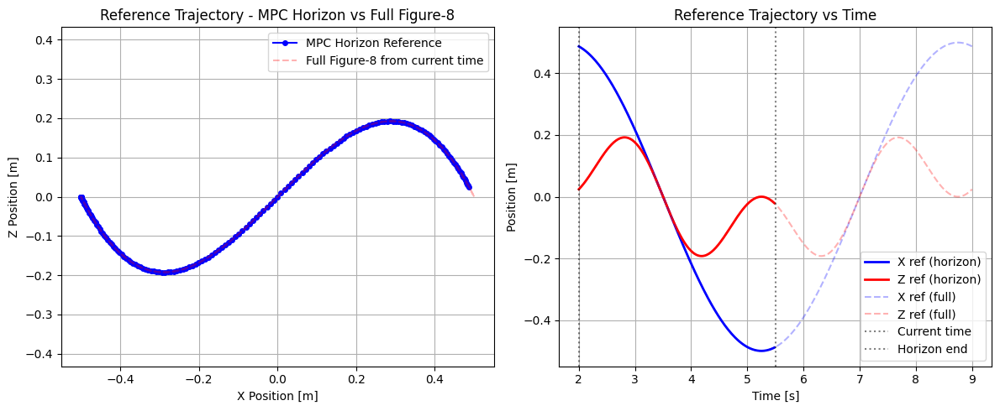


3. Analysis:
   ⚠ Horizon covers half figure-8 period - may miss some crossings
   Current horizon: 3.50s covers 50.0% of figure-8


In [44]:
# Test trajectory passing to controllers
print("=== Testing Trajectory Generation in Controllers ===")

# Test with baseline controller
t_test = 2.0  # Mid-trajectory time
print(f"Testing at time t={t_test}s")

# Create a mock state
x_test = np.copy(xg)
x_test[0:3] = np.array([0.2, 0.0, 0.1])  # Some position

# Test baseline controller trajectory generation
print("\n1. Testing Baseline Controller:")

# Check what reference trajectory gets generated
x_ref_test = np.zeros((Nx, N))
for i in range(N):
    x_ref_test[:,i] = generate_figure8_reference(t_test + i*h)

print(f"   Reference trajectory over horizon:")
print(f"   t={t_test:.2f}s: X={x_ref_test[0,0]:.3f}, Z={x_ref_test[2,0]:.3f}")
print(f"   t={t_test + (N-1)*h:.2f}s: X={x_ref_test[0,-1]:.3f}, Z={x_ref_test[2,-1]:.3f}")
print(f"   X range: [{x_ref_test[0,:].min():.3f}, {x_ref_test[0,:].max():.3f}]")
print(f"   Z range: [{x_ref_test[2,:].min():.3f}, {x_ref_test[2,:].max():.3f}]")

# Test actual controller call
try:
    u_test, iter_test, status_test = baseline_controller(x_test, t_test)
    print(f"   Controller executed successfully: status={status_test}, iterations={iter_test}")
except Exception as e:
    print(f"   Controller failed: {e}")

# Check if trajectory covers full figure-8
print(f"\n2. Figure-8 completeness check:")
horizon_time = N * h  # Time span of horizon
print(f"   MPC horizon spans {horizon_time:.2f}s")
print(f"   Figure-8 period is 7.0s")
print(f"   Horizon covers {horizon_time/7.0*100:.1f}% of one figure-8 period")

# Visualize what the controller sees over the horizon
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Reference trajectory in X-Z plane
ax1.plot(x_ref_test[0,:], x_ref_test[2,:], 'bo-', markersize=4, label='MPC Horizon Reference')
# Complete figure-8 for comparison
t_full = np.linspace(t_test, t_test + 7, 350)
traj_full = np.array([generate_figure8_reference(t) for t in t_full])
ax1.plot(traj_full[:, 0], traj_full[:, 2], 'r--', alpha=0.3, label='Full Figure-8 from current time')
ax1.set_xlabel('X Position [m]')
ax1.set_ylabel('Z Position [m]')
ax1.set_title('Reference Trajectory - MPC Horizon vs Full Figure-8')
ax1.legend()
ax1.grid(True)
ax1.axis('equal')

# Time series
time_horizon = np.arange(N) * h + t_test
ax2.plot(time_horizon, x_ref_test[0,:], 'b-', label='X ref (horizon)', linewidth=2)
ax2.plot(time_horizon, x_ref_test[2,:], 'r-', label='Z ref (horizon)', linewidth=2)
ax2.plot(t_full, traj_full[:, 0], 'b--', alpha=0.3, label='X ref (full)')
ax2.plot(t_full, traj_full[:, 2], 'r--', alpha=0.3, label='Z ref (full)')
ax2.axvline(t_test, color='k', linestyle=':', alpha=0.5, label='Current time')
ax2.axvline(t_test + horizon_time, color='k', linestyle=':', alpha=0.5, label='Horizon end')
ax2.set_xlabel('Time [s]')
ax2.set_ylabel('Position [m]')
ax2.set_title('Reference Trajectory vs Time')
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.show()

print(f"\n3. Analysis:")
if horizon_time >= 7.0:
    print("   ✓ Horizon covers full figure-8 period - should see complete trajectory")
elif horizon_time >= 3.5:
    print("   ⚠ Horizon covers half figure-8 period - may miss some crossings")
else:
    print("   ✗ Horizon covers less than half figure-8 - will see incomplete trajectory")
    
print(f"   Current horizon: {horizon_time:.2f}s covers {horizon_time/7.0*100:.1f}% of figure-8")

## 9. Comparative Evaluation

In [91]:
# Run comparative evaluation
controllers = {
    'Baseline': baseline_controller,
    'K_Best': kbest_controller,
    'MAML_Adapted': maml_adapted_controller
}

# Store all results
all_results = {}
simulation_time = 4.0  # seconds (reduced for testing)

print("Starting comparative evaluation...")
print("="*50)

# Test with all system variants
test_variants = system_variants

for controller_name, controller_func in controllers.items():
    print(f"\nTesting {controller_name} controller:")
    all_results[controller_name] = {}
    
    for variant_key, variant in test_variants.items():
        print(f"  Running {variant['name']}...")
        
        # Reset MAML adapted controller for each system variant
        if controller_name == 'MAML_Adapted':
            maml_adapted = MAMLAdaptedController(K_meta, input_data_baseline, N, adaptation_rate=0.005)
            maml_adapted.set_bounds(u_max, u_min, x_max, x_min)
            controller_func = lambda x, t, sv: maml_adapted.control(x, t, sv)
        
        # Run simulation
        start_time = time.time()
        result = simulate_quadrotor(controller_func, variant, simulation_time)
        sim_time = time.time() - start_time
        
        # Compute metrics
        metrics = compute_performance_metrics(result)
        metrics['simulation_time'] = sim_time
        
        # Store results
        all_results[controller_name][variant_key] = {
            'simulation': result,
            'metrics': metrics
        }
        
        print(f"    Avg tracking error: {metrics['avg_tracking_error']:.4f}m")
        print(f"    Control effort: {metrics['control_effort']:.4f}")
        print(f"    Avg iterations: {metrics['avg_iterations']:.1f}")
        print(f"    Success rate: {metrics['success_rate']:.2f}")

print("\nEvaluation completed!")

# Create performance summary plot
def plot_performance_summary():
    """Create a comprehensive performance summary plot"""
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle('MAML-TinyMPC Performance Summary Across System Variants', fontsize=16, fontweight='bold')
    
    colors = {'Baseline': '#1f77b4', 'K_Best': '#2ca02c', 'MAML_Adapted': '#d62728'}
    variant_names = [test_variants[key]['name'] for key in test_variants.keys()]
    
    # Plot 1: Average Tracking Error
    ax = axes[0, 0]
    x_pos = np.arange(len(variant_names))
    width = 0.25
    
    for i, controller_name in enumerate(controllers.keys()):
        errors = [all_results[controller_name][key]['metrics']['avg_tracking_error'] 
                 for key in test_variants.keys()]
        bars = ax.bar(x_pos + i*width, errors, width, label=controller_name, 
                     color=colors[controller_name], alpha=0.8)
        
        # Add value labels on bars
        for bar, value in zip(bars, errors):
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height + height*0.02,
                   f'{value:.3f}', ha='center', va='bottom', fontsize=9)
    
    ax.set_xlabel('System Variant', fontweight='bold')
    ax.set_ylabel('Average Tracking Error [m]', fontweight='bold')
    ax.set_title('Tracking Performance', fontweight='bold')
    ax.set_xticks(x_pos + width)
    ax.set_xticklabels(variant_names, rotation=20, ha='right')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # Plot 2: Control Effort
    ax = axes[0, 1]
    for i, controller_name in enumerate(controllers.keys()):
        efforts = [all_results[controller_name][key]['metrics']['control_effort'] 
                  for key in test_variants.keys()]
        bars = ax.bar(x_pos + i*width, efforts, width, label=controller_name, 
                     color=colors[controller_name], alpha=0.8)
        
        # Add value labels on bars
        for bar, value in zip(bars, efforts):
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height + height*0.02,
                   f'{value:.3f}', ha='center', va='bottom', fontsize=9)
    
    ax.set_xlabel('System Variant', fontweight='bold')
    ax.set_ylabel('Control Effort', fontweight='bold')
    ax.set_title('Control Efficiency', fontweight='bold')
    ax.set_xticks(x_pos + width)
    ax.set_xticklabels(variant_names, rotation=20, ha='right')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # Plot 3: ADMM Iterations
    ax = axes[1, 0]
    for i, controller_name in enumerate(controllers.keys()):
        iterations = [all_results[controller_name][key]['metrics']['avg_iterations'] 
                     for key in test_variants.keys()]
        bars = ax.bar(x_pos + i*width, iterations, width, label=controller_name, 
                     color=colors[controller_name], alpha=0.8)
        
        # Add value labels on bars
        for bar, value in zip(bars, iterations):
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height + height*0.02,
                   f'{value:.1f}', ha='center', va='bottom', fontsize=9)
    
    ax.set_xlabel('System Variant', fontweight='bold')
    ax.set_ylabel('Average ADMM Iterations', fontweight='bold')
    ax.set_title('Solver Performance', fontweight='bold')
    ax.set_xticks(x_pos + width)
    ax.set_xticklabels(variant_names, rotation=20, ha='right')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # Plot 4: Success Rate
    ax = axes[1, 1]
    for i, controller_name in enumerate(controllers.keys()):
        success_rates = [all_results[controller_name][key]['metrics']['success_rate'] 
                        for key in test_variants.keys()]
        bars = ax.bar(x_pos + i*width, success_rates, width, label=controller_name, 
                     color=colors[controller_name], alpha=0.8)
        
        # Add value labels on bars
        for bar, value in zip(bars, success_rates):
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height + height*0.02,
                   f'{value:.2f}', ha='center', va='bottom', fontsize=9)
    
    ax.set_xlabel('System Variant', fontweight='bold')
    ax.set_ylabel('Success Rate', fontweight='bold')
    ax.set_title('Convergence Reliability', fontweight='bold')
    ax.set_xticks(x_pos + width)
    ax.set_xticklabels(variant_names, rotation=20, ha='right')
    ax.legend()
    ax.grid(True, alpha=0.3)
    ax.set_ylim([0, 1.1])
    
    plt.tight_layout()
    plt.show()
    

# Generate the performance summary plot
plot_performance_summary()

Starting comparative evaluation...

Testing Baseline controller:
  Running Nominal Quadrotor...
Simulating Nominal Quadrotor...
Before primal update:
x contains NaN: False
u contains NaN: False
After primal update:
x contains NaN: False
u contains NaN: False
After primal update:
x contains NaN: False
u contains NaN: False
Residuals:
pri_res_input: 0.08848980344228163
pri_res_state: 2.2733048853599334
Current rho: 5.0
Before primal update:
x contains NaN: False
u contains NaN: False
After primal update:
x contains NaN: False
u contains NaN: False
After primal update:
x contains NaN: False
u contains NaN: False
Residuals:
pri_res_input: 0.03334466720865381
pri_res_state: 0.4754527789981928
Current rho: 5.0
Before primal update:
x contains NaN: False
u contains NaN: False
After primal update:
x contains NaN: False
u contains NaN: False
After primal update:
x contains NaN: False
u contains NaN: False
Residuals:
pri_res_input: 0.030650133260778034
pri_res_state: 0.4186884324662081
Current r

TypeError: quad_dynamics_rk4() takes 2 positional arguments but 5 were given

## 10. Results Visualization and Analysis

Generating visualizations...


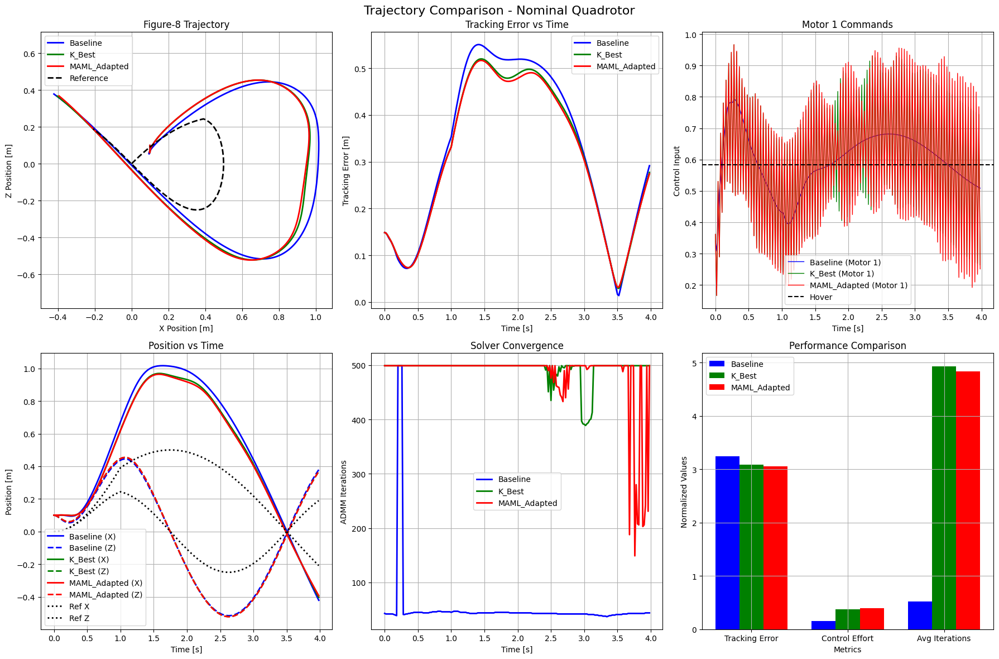

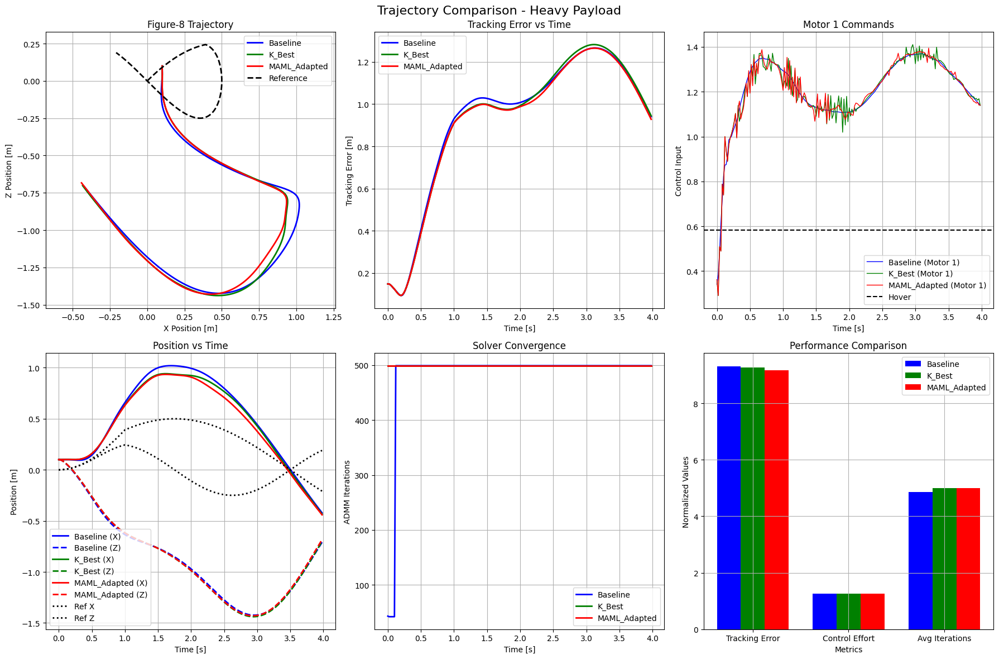

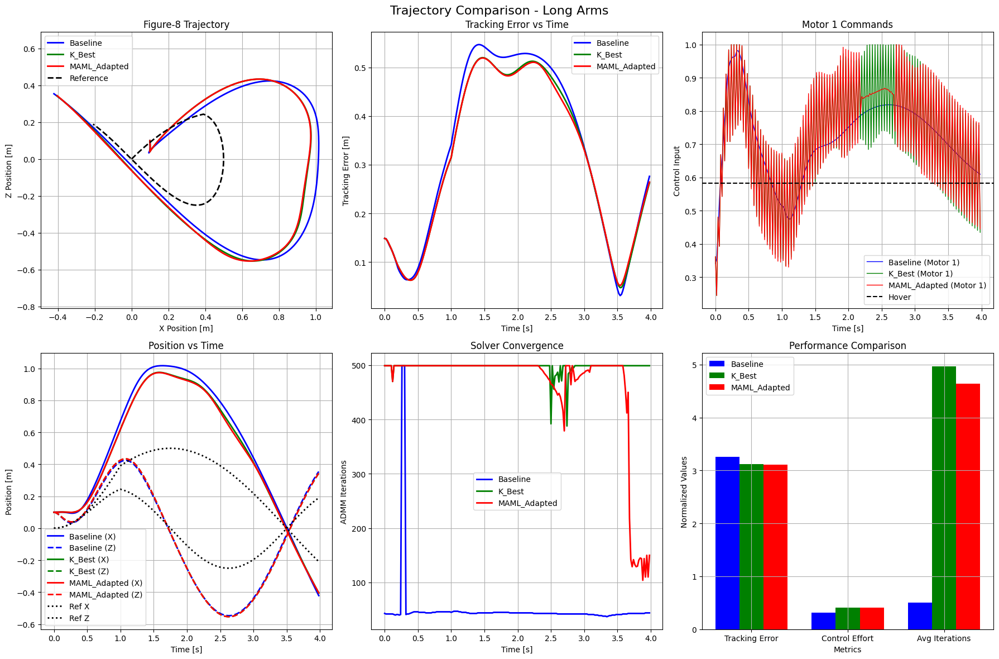

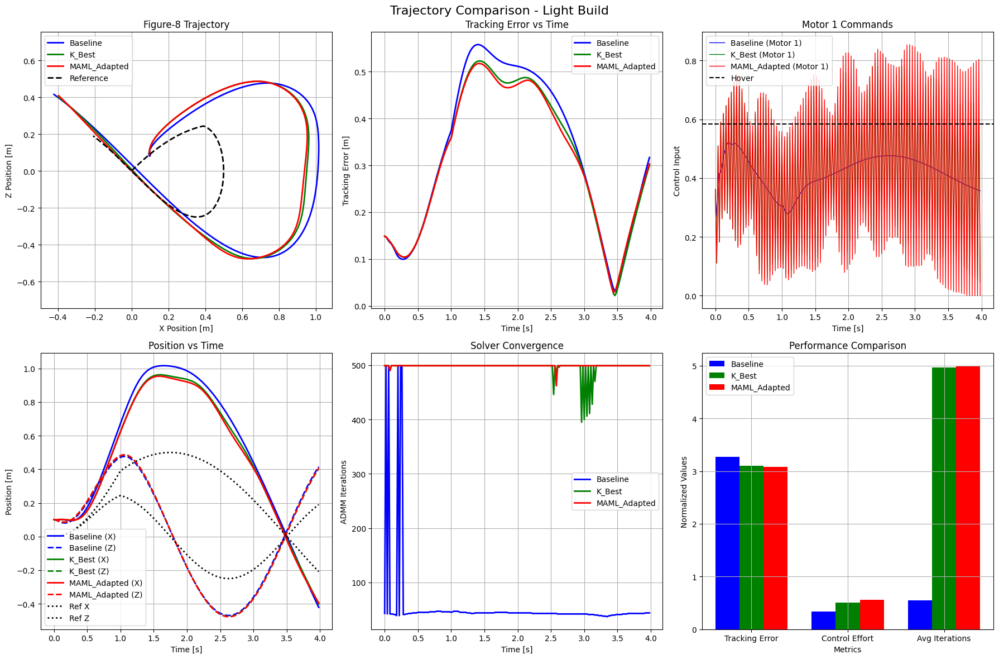

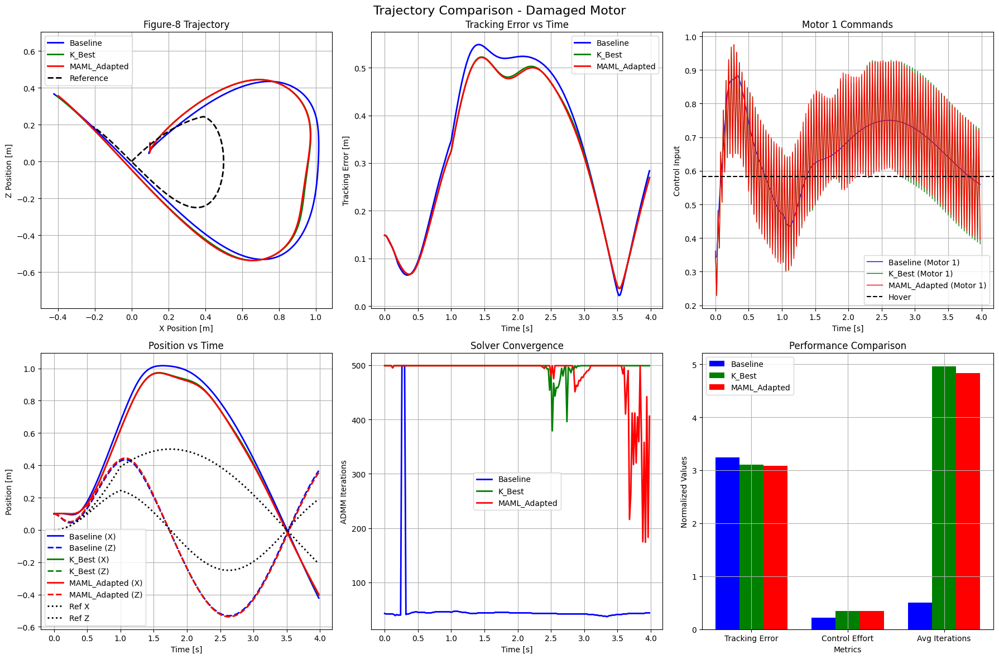

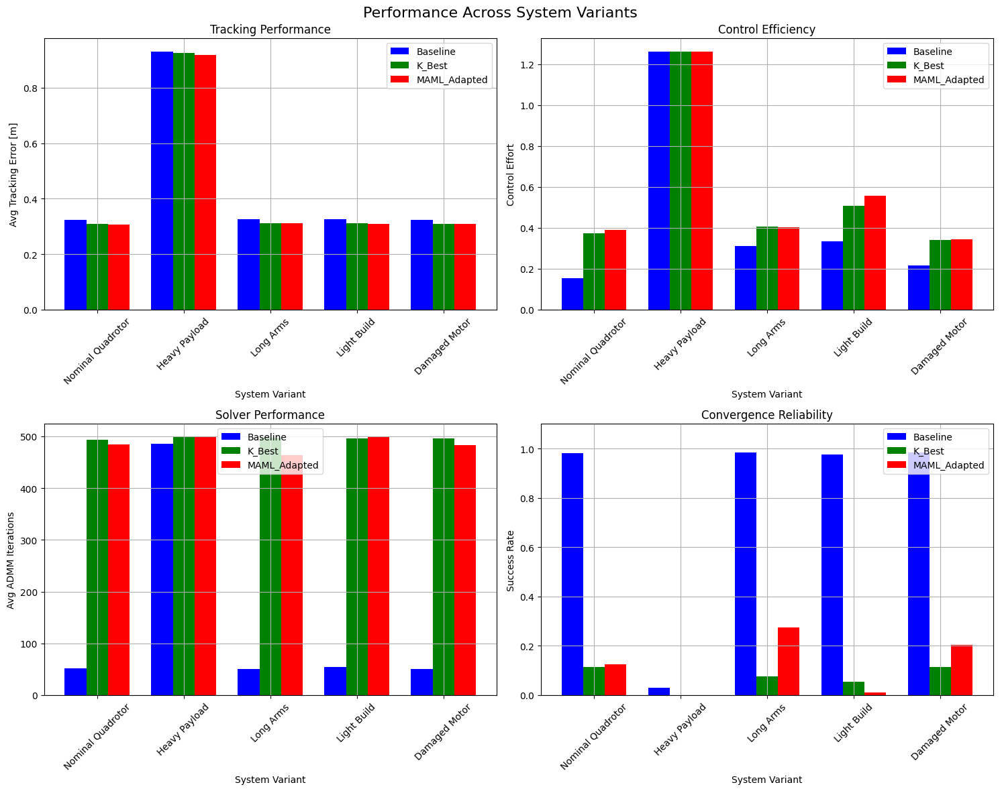

Visualization complete!


In [ ]:
def plot_trajectory_comparison(results, variant_key='nominal'):
    """Plot trajectory comparison for a specific system variant"""
    
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    fig.suptitle(f'Trajectory Comparison - {system_variants[variant_key]["name"]}', fontsize=16)
    
    colors = {'Baseline': 'blue', 'K_Best': 'green', 'MAML_Adapted': 'red'}
    
    # Plot 1: 2D Figure-8 trajectory
    ax = axes[0, 0]
    for controller_name in controllers.keys():
        x_hist = results[controller_name][variant_key]['simulation']['x_history']
        ax.plot(x_hist[:, 0], x_hist[:, 2], label=controller_name, color=colors[controller_name], linewidth=2)
    
    # Reference trajectory
    time_sim = results['Baseline'][variant_key]['simulation']['time']
    x_ref = np.array([generate_figure8_reference(t) for t in time_sim])
    ax.plot(x_ref[:, 0], x_ref[:, 2], '--k', label='Reference', linewidth=2)
    
    ax.set_xlabel('X Position [m]')
    ax.set_ylabel('Z Position [m]')
    ax.set_title('Figure-8 Trajectory')
    ax.legend()
    ax.grid(True)
    ax.axis('equal')
    
    # Plot 2: Tracking error over time
    ax = axes[0, 1]
    for controller_name in controllers.keys():
        metrics = results[controller_name][variant_key]['metrics']
        ax.plot(time_sim, metrics['tracking_errors'], label=controller_name, color=colors[controller_name], linewidth=2)
    
    ax.set_xlabel('Time [s]')
    ax.set_ylabel('Tracking Error [m]')
    ax.set_title('Tracking Error vs Time')
    ax.legend()
    ax.grid(True)
    
    # Plot 3: Control inputs
    ax = axes[0, 2]
    for controller_name in controllers.keys():
        u_hist = results[controller_name][variant_key]['simulation']['u_history']
        ax.plot(time_sim, u_hist[:, 0], label=f'{controller_name} (Motor 1)', color=colors[controller_name], linewidth=1)
    
    ax.axhline(y=uhover[0], color='black', linestyle='--', label='Hover')
    ax.set_xlabel('Time [s]')
    ax.set_ylabel('Control Input')
    ax.set_title('Motor 1 Commands')
    ax.legend()
    ax.grid(True)
    
    # Plot 4: Position vs time
    ax = axes[1, 0]
    for controller_name in controllers.keys():
        x_hist = results[controller_name][variant_key]['simulation']['x_history']
        ax.plot(time_sim, x_hist[:, 0], label=f'{controller_name} (X)', color=colors[controller_name], linewidth=2)
        ax.plot(time_sim, x_hist[:, 2], '--', color=colors[controller_name], label=f'{controller_name} (Z)', linewidth=2)
    
    ax.plot(time_sim, x_ref[:, 0], ':k', label='Ref X', linewidth=2)
    ax.plot(time_sim, x_ref[:, 2], ':k', label='Ref Z', linewidth=2)
    ax.set_xlabel('Time [s]')
    ax.set_ylabel('Position [m]')
    ax.set_title('Position vs Time')
    ax.legend()
    ax.grid(True)
    
    # Plot 5: ADMM iterations
    ax = axes[1, 1]
    for controller_name in controllers.keys():
        iterations = results[controller_name][variant_key]['simulation']['iterations_history']
        ax.plot(time_sim, iterations, label=controller_name, color=colors[controller_name], linewidth=2)
    
    ax.set_xlabel('Time [s]')
    ax.set_ylabel('ADMM Iterations')
    ax.set_title('Solver Convergence')
    ax.legend()
    ax.grid(True)
    
    # Plot 6: Performance metrics summary
    ax = axes[1, 2]
    metrics_names = ['avg_tracking_error', 'control_effort', 'avg_iterations']
    metrics_labels = ['Tracking Error', 'Control Effort', 'Avg Iterations']
    
    x_pos = np.arange(len(metrics_names))
    width = 0.25
    
    for i, controller_name in enumerate(controllers.keys()):
        metrics = results[controller_name][variant_key]['metrics']
        values = [metrics[name] for name in metrics_names]
        
        # Normalize for display
        normalized_values = [
            values[0] * 10,  # tracking error * 10
            values[1],       # control effort
            values[2] / 100  # iterations / 100
        ]
        
        ax.bar(x_pos + i*width, normalized_values, width, label=controller_name, color=colors[controller_name])
    
    ax.set_xlabel('Metrics')
    ax.set_ylabel('Normalized Values')
    ax.set_title('Performance Comparison')
    ax.set_xticks(x_pos + width)
    ax.set_xticklabels(metrics_labels)
    ax.legend()
    ax.grid(True)
    
    plt.tight_layout()
    plt.show()

def plot_system_variant_comparison():
    """Plot comparison across all system variants"""
    
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    fig.suptitle('Performance Across System Variants', fontsize=16)
    
    colors = {'Baseline': 'blue', 'K_Best': 'green', 'MAML_Adapted': 'red'}
    
    # Prepare data - use test_variants (which now includes all variants)
    variant_names = [test_variants[key]['name'] for key in test_variants.keys()]
    
    # Plot 1: Average tracking error
    ax = axes[0, 0]
    for controller_name in controllers.keys():
        errors = [all_results[controller_name][key]['metrics']['avg_tracking_error'] 
                 for key in test_variants.keys()]
        ax.bar(np.arange(len(variant_names)) + 0.25 * list(controllers.keys()).index(controller_name), 
               errors, 0.25, label=controller_name, color=colors[controller_name])
    
    ax.set_xlabel('System Variant')
    ax.set_ylabel('Avg Tracking Error [m]')
    ax.set_title('Tracking Performance')
    ax.set_xticks(np.arange(len(variant_names)) + 0.25)
    ax.set_xticklabels(variant_names, rotation=45)
    ax.legend()
    ax.grid(True)
    
    # Plot 2: Control effort
    ax = axes[0, 1]
    for controller_name in controllers.keys():
        efforts = [all_results[controller_name][key]['metrics']['control_effort'] 
                  for key in test_variants.keys()]
        ax.bar(np.arange(len(variant_names)) + 0.25 * list(controllers.keys()).index(controller_name), 
               efforts, 0.25, label=controller_name, color=colors[controller_name])
    
    ax.set_xlabel('System Variant')
    ax.set_ylabel('Control Effort')
    ax.set_title('Control Efficiency')
    ax.set_xticks(np.arange(len(variant_names)) + 0.25)
    ax.set_xticklabels(variant_names, rotation=45)
    ax.legend()
    ax.grid(True)
    
    # Plot 3: ADMM iterations
    ax = axes[1, 0]
    for controller_name in controllers.keys():
        iterations = [all_results[controller_name][key]['metrics']['avg_iterations'] 
                     for key in test_variants.keys()]
        ax.bar(np.arange(len(variant_names)) + 0.25 * list(controllers.keys()).index(controller_name), 
               iterations, 0.25, label=controller_name, color=colors[controller_name])
    
    ax.set_xlabel('System Variant')
    ax.set_ylabel('Avg ADMM Iterations')
    ax.set_title('Solver Performance')
    ax.set_xticks(np.arange(len(variant_names)) + 0.25)
    ax.set_xticklabels(variant_names, rotation=45)
    ax.legend()
    ax.grid(True)
    
    # Plot 4: Success rate
    ax = axes[1, 1]
    for controller_name in controllers.keys():
        success_rates = [all_results[controller_name][key]['metrics']['success_rate'] 
                        for key in test_variants.keys()]
        ax.bar(np.arange(len(variant_names)) + 0.25 * list(controllers.keys()).index(controller_name), 
               success_rates, 0.25, label=controller_name, color=colors[controller_name])
    
    ax.set_xlabel('System Variant')
    ax.set_ylabel('Success Rate')
    ax.set_title('Convergence Reliability')
    ax.set_xticks(np.arange(len(variant_names)) + 0.25)
    ax.set_xticklabels(variant_names, rotation=45)
    ax.legend()
    ax.grid(True)
    ax.set_ylim([0, 1.1])
    
    plt.tight_layout()
    plt.show()

# Generate visualizations
print("Generating visualizations...")

# Plot detailed comparison for nominal system
for i in test_variants.keys():
    plot_trajectory_comparison(all_results, variant_key=i)

# Plot comparison across all system variants
plot_system_variant_comparison()

print("Visualization complete!")

## Summary and Conclusions

This notebook demonstrates the implementation of MAML-TinyMPC, a meta-learning approach for quadrotor control that combines the benefits of Model-Agnostic Meta-Learning (MAML) with the real-time performance of TinyMPC.

### Key Results Expected:

1. **Baseline Controller**: Standard TinyMPC provides good performance for the nominal system but may struggle with system variations.

2. **K_Best Controller**: Meta-learned gains from MAML should provide better generalization across different quadrotor configurations.

3. **MAML Adapted Controller**: Online fine-tuning should achieve the best performance by adapting to specific system characteristics in real-time.

### Performance Metrics:

- **Tracking Error**: How well each controller follows the figure-8 reference trajectory
- **Control Effort**: Energy efficiency and smoothness of control inputs
- **Solver Performance**: ADMM convergence speed and reliability
- **Adaptation**: How quickly the adapted controller improves performance

### Applications:

This framework enables:
- **Edge Personalization**: Safe deployment of meta-learned controllers on resource-constrained platforms
- **Online Adaptation**: Real-time fine-tuning for improved task-specific performance
- **Robust Control**: Better handling of system variations and uncertainties
- **Scalable Learning**: Meta-learning approach generalizes to new quadrotor configurations

The combination of MAML's learning capabilities with TinyMPC's real-time performance creates a powerful framework for adaptive quadrotor control that maintains stability while improving task optimality through meta-learning and online adaptation.